<a href="https://colab.research.google.com/github/Liam876/t-SNE_Project/blob/main/notebooks/Circles_Focused_Visualization_Exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from time import time
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import NullFormatter
from sklearn import datasets, manifold
from sklearn.decomposition import PCA
import pandas as pd
import pickle

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


#Setting some constants and generating dataset

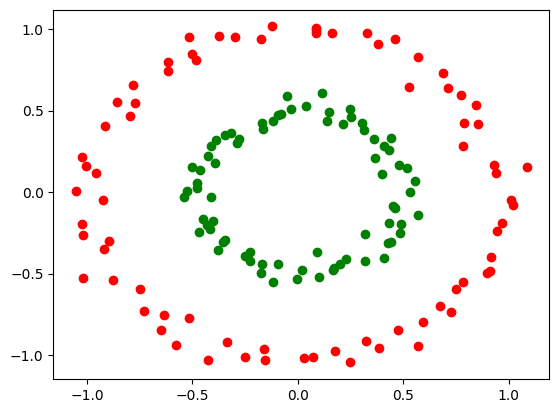

In [ ]:
n_samples = 150
factor = 0.5
noise = 0.05
random_state = 0
n_results = 5000
perplexity_res = 30
n_components = 2
start = 0
np.random.seed(51)

circles, labels = datasets.make_circles(n_samples=n_samples, factor=factor, noise=noise, random_state=random_state)
red = labels == 0
green = labels == 1
plt.scatter(circles[red,0],circles[red,1], c = 'r')
plt.scatter(circles[green,0],circles[green,1], c = 'g')
plt.show()

In [ ]:
def classify_kl(val):
  return val < 0.216

In [ ]:
X_res = np.zeros((n_results,n_samples* n_components))
X_ex = np.zeros((n_results,n_samples* n_components))
y = np.ones((n_results),dtype = int)*-1

#Exploring Convergence

### Randomness testing

REMINDER TO SELF: seed ensures same result on different runs but different results for multiple iterations during same run

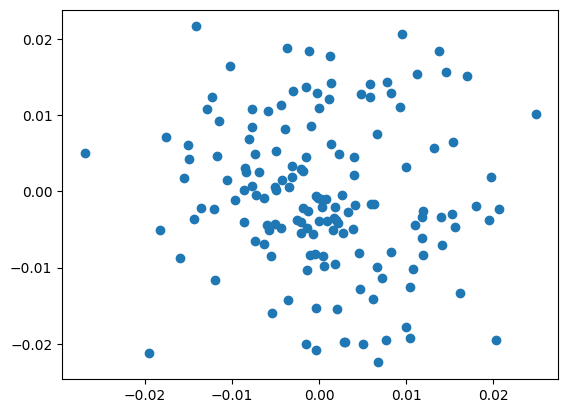

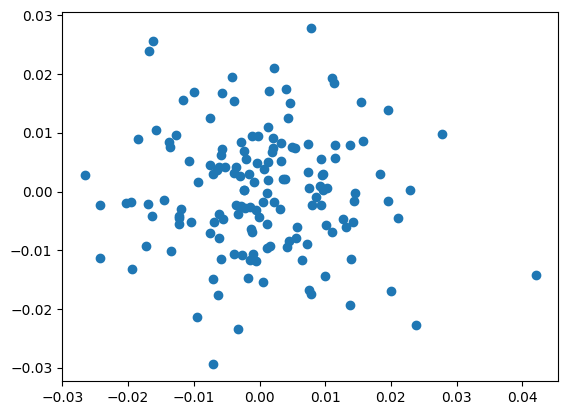

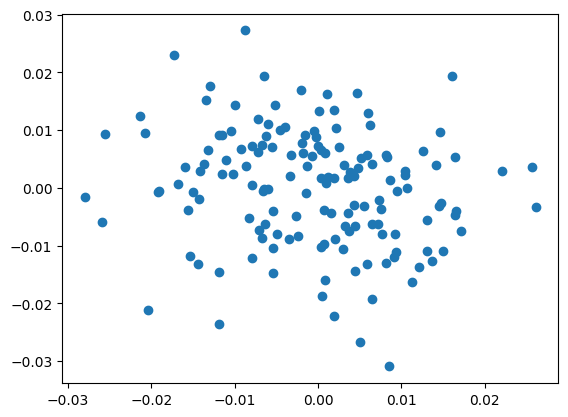

In [ ]:
np.random.seed(46)
for i in range(3):
  init = np.random.multivariate_normal(mean = [0,0],cov = np.eye(2)*10**-4,size = 150)
  plt.scatter(init[:,0],init[:,1])
  plt.show()

## plotting intermidiate results

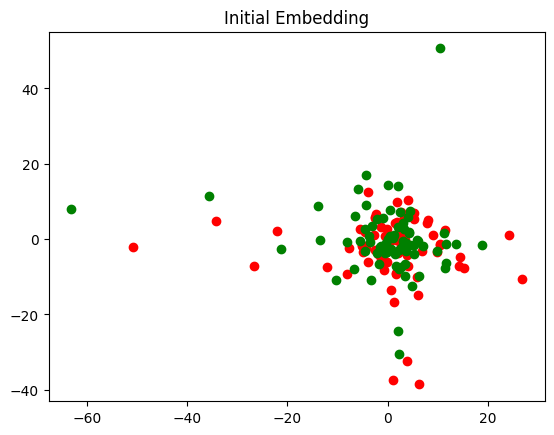

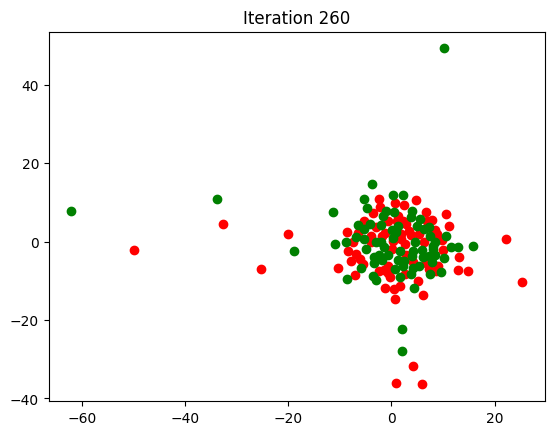

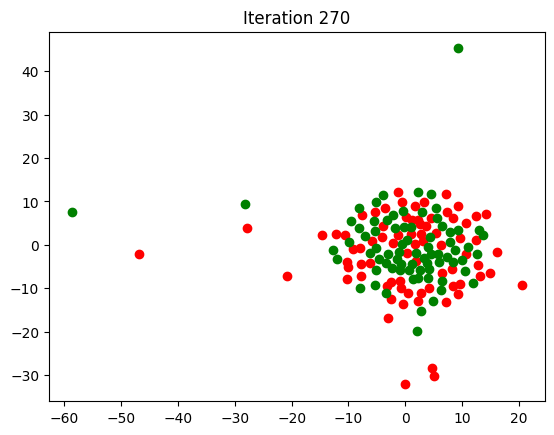

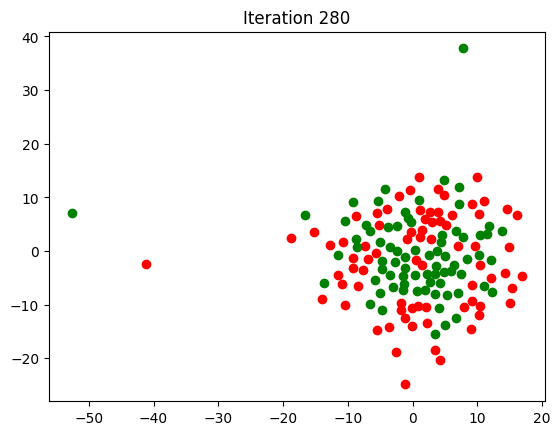

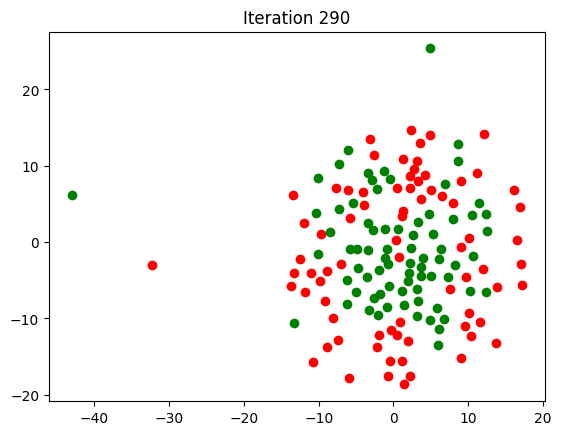

...

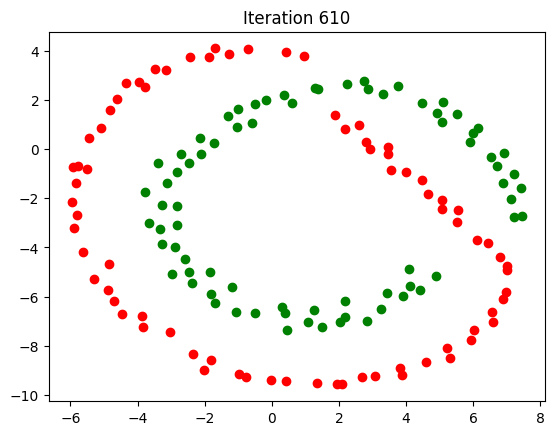

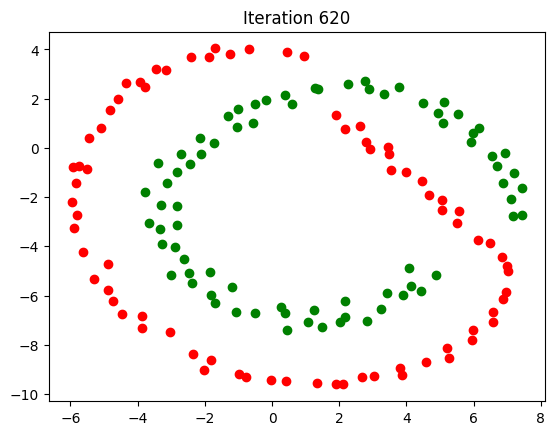

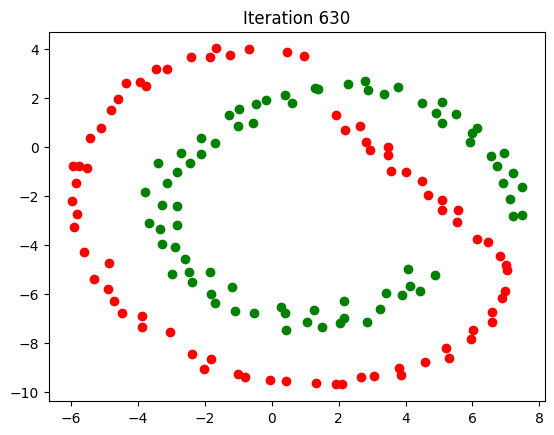

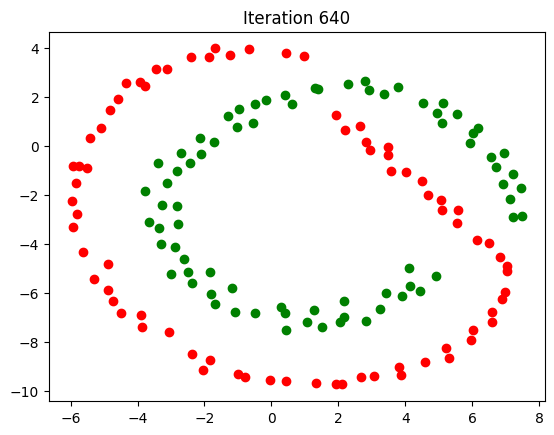

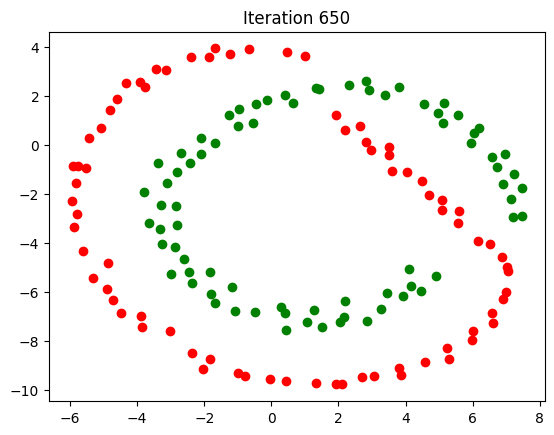

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.datasets import make_blobs

import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.datasets import make_blobs

# Set data
X = circles
init = np.random.multivariate_normal(mean = [0,0],cov = np.eye(2)*10**-4,size = 150)
np.random.seed(46)
# Set constants
total_iterations = 650
interval = 10
start = 250

# Set up t-SNE parameters
tsne_start = TSNE(n_components=2,init = init,early_exaggeration=250, n_iter=250)  # Set n_iter to 0 initially

# Perform t-SNE once
embedding_initial = tsne_start.fit_transform(X)

# Plot the initial early exxageration embedding
plt.scatter(embedding_initial[red, 0], embedding_initial[red, 1],c = 'red')
plt.scatter(embedding_initial[green, 0], embedding_initial[green, 1],c = 'green')
plt.title('Initial Embedding')
plt.show()

# Perform t-SNE and plot the embedding at specified iterations
for i in range(start+interval, total_iterations + 1,interval):
    # Update t-SNE iterations
    tsne = TSNE(n_components=2, random_state=42,init = init,early_exaggeration=250, n_iter=i)

    # Transform data using t-SNE
    embedding = tsne.fit_transform(X)

    # Plot the embedding at specified intervals
    plt.scatter(embedding[red, 0], embedding[red, 1],c = 'red')
    plt.scatter(embedding[green, 0], embedding[green, 1],c = 'green')
    plt.title(f'Iteration {i}')
    plt.show()


Same but in animation

Good Convergence animation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.datasets import make_blobs
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

# Set data
X = circles  # You may need to define the 'circles' variable

# Set constants
total_iterations = 650
interval = 5
start = 250
np.random.seed(40)

counter = 1
init = np.random.multivariate_normal(mean = [0,0],cov = np.eye(2)*10**-4,size = 150)
# Set up t-SNE parameters
tsne_start = TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=250)  # Set n_iter to 0 initially
tsne_final =  TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=2050)

final_emb = tsne_final.fit_transform(X)

while tsne_final.kl_divergence_ > 0.216:
  print(f"Init points number {counter}")
  init = np.random.multivariate_normal(mean = [0,0],cov = np.eye(2)*10**-4,size = 150)
  # Set up t-SNE parameters
  tsne_start = TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=250)  # Set n_iter to 0 initially
  tsne_final =  TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=2050)

  final_emb = tsne_final.fit_transform(X)
  counter+= 1

print(f"Horray! Init points number {counter}")
# Perform t-SNE once
embedding_initial = tsne_start.fit_transform(X)

# Set up the plot
fig, ax = plt.subplots(figsize = (8,4))
scatter1 = ax.scatter(embedding_initial[red, 0], embedding_initial[red, 1], c='red')
scatter2 = ax.scatter(embedding_initial[green, 0], embedding_initial[green, 1], c='green')
title = ax.set_title('t-SNE Embedding')

# Animation update function
def update(frame):
    global start  # Add this line to use the global variable 'start'
    print(f"{start + frame * interval}/{total_iterations} - {round(100*(start + frame * interval)/total_iterations,2)}%")
    # Update t-SNE iterations
    tsne = TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=start + frame * interval)

    # Transform data using t-SNE
    embedding = tsne.fit_transform(X)

    # Update scatter plot data
    scatter1.set_offsets(embedding[red])
    scatter2.set_offsets(embedding[green])

    # Update title
    title.set_text(f'Iteration {start + frame * interval}')

    # Set axis limits dynamically based on the data
    ax.set_xlim(np.min(embedding[:, 0]) - 1, np.max(embedding[:, 0]) + 1)
    ax.set_ylim(np.min(embedding[:, 1]) - 1, np.max(embedding[:, 1]) + 1)


# Make the plot tight
plt.tight_layout()

# Create animation
ani = FuncAnimation(fig, update, frames=np.arange(0,(total_iterations - start) // interval), interval=130, blit=False)

# Save the animation as a GIF file
animation_file = 'tsne_good_conv_animation.gif'
ani.save(animation_file, writer='imagemagick')

# Display the animation
HTML(ani.to_jshtml())

Horray! Init points number 1


<IPython.core.display.Javascript object>

250/650 - 38.46%
250/650 - 38.46%
255/650 - 39.23%
260/650 - 40.0%
265/650 - 40.77%
270/650 - 41.54%
275/650 - 42.31%
280/650 - 43.08%
285/650 - 43.85%
290/650 - 44.62%
295/650 - 45.38%
300/650 - 46.15%
305/650 - 46.92%
310/650 - 47.69%
315/650 - 48.46%
320/650 - 49.23%
325/650 - 50.0%
330/650 - 50.77%
335/650 - 51.54%
340/650 - 52.31%
345/650 - 53.08%
350/650 - 53.85%
355/650 - 54.62%
360/650 - 55.38%
365/650 - 56.15%
370/650 - 56.92%
375/650 - 57.69%
380/650 - 58.46%
385/650 - 59.23%
390/650 - 60.0%
395/650 - 60.77%
400/650 - 61.54%
405/650 - 62.31%
410/650 - 63.08%
415/650 - 63.85%
420/650 - 64.62%
425/650 - 65.38%
430/650 - 66.15%
435/650 - 66.92%
440/650 - 67.69%
445/650 - 68.46%
450/650 - 69.23%
455/650 - 70.0%
460/650 - 70.77%
465/650 - 71.54%
470/650 - 72.31%
475/650 - 73.08%
480/650 - 73.85%
485/650 - 74.62%
490/650 - 75.38%
495/650 - 76.15%
500/650 - 76.92%
505/650 - 77.69%
510/650 - 78.46%
515/650 - 79.23%
520/650 - 80.0%
525/650 - 80.77%
530/650 - 81.54%
535/650 - 82.31%
54

Bad convergence animation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.datasets import make_blobs
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

# Set data
X = circles  # You may need to define the 'circles' variable

# Set constants
total_iterations = 650
interval = 5
start = 250
np.random.seed(40)

counter = 1
init = np.random.multivariate_normal(mean = [0,0],cov = np.eye(2)*10**-4,size = 150)
# Set up t-SNE parameters
tsne_start = TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=250)  # Set n_iter to 0 initially
tsne_final =  TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=2050)

final_emb = tsne_final.fit_transform(X)

while tsne_final.kl_divergence_ <= 0.216:
  print(f"Init points number {counter}")
  init = np.random.multivariate_normal(mean = [0,0],cov = np.eye(2)*10**-4,size = 150)
  # Set up t-SNE parameters
  tsne_start = TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=250)  # Set n_iter to 0 initially
  tsne_final =  TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=2050)

  final_emb = tsne_final.fit_transform(X)
  counter+= 1

print(f"Horray! Init points number {counter}")
# Perform t-SNE once
embedding_initial = tsne_start.fit_transform(X)

# Set up the plot
fig, ax = plt.subplots(figsize = (8,4))
scatter1 = ax.scatter(embedding_initial[red, 0], embedding_initial[red, 1], c='red')
scatter2 = ax.scatter(embedding_initial[green, 0], embedding_initial[green, 1], c='green')
title = ax.set_title('t-SNE Embedding')

# Animation update function
def update(frame):
    global start  # Add this line to use the global variable 'start'
    print(f"{start + frame * interval}/{total_iterations} - {round(100*(start + frame * interval)/total_iterations,2)}%")
    # Update t-SNE iterations
    tsne = TSNE(n_components=2, init=init, early_exaggeration=250, n_iter=start + frame * interval)

    # Transform data using t-SNE
    embedding = tsne.fit_transform(X)

    # Update scatter plot data
    scatter1.set_offsets(embedding[red])
    scatter2.set_offsets(embedding[green])

    # Update title
    title.set_text(f'Iteration {start + frame * interval}')

    # Set axis limits dynamically based on the data
    ax.set_xlim(np.min(embedding[:, 0]) - 1, np.max(embedding[:, 0]) + 1)
    ax.set_ylim(np.min(embedding[:, 1]) - 1, np.max(embedding[:, 1]) + 1)



# Make the plot tight
plt.tight_layout()

# Create animation
ani = FuncAnimation(fig, update, frames=np.arange(0,(total_iterations - start) // interval), interval=130, blit=False)

# Save the animation as a GIF file
animation_file = 'tsne_bad_conv_animation.gif'
ani.save(animation_file, writer='imagemagick')

# Display the animation
HTML(ani.to_jshtml())

Init points number 1
Init points number 2
Horray! Init points number 3


<IPython.core.display.Javascript object>

250/650 - 38.46%
250/650 - 38.46%
255/650 - 39.23%
260/650 - 40.0%
265/650 - 40.77%
270/650 - 41.54%
275/650 - 42.31%
280/650 - 43.08%
285/650 - 43.85%
290/650 - 44.62%
295/650 - 45.38%
300/650 - 46.15%
305/650 - 46.92%
310/650 - 47.69%
315/650 - 48.46%
320/650 - 49.23%
325/650 - 50.0%
330/650 - 50.77%
335/650 - 51.54%
340/650 - 52.31%
345/650 - 53.08%
350/650 - 53.85%
355/650 - 54.62%
360/650 - 55.38%
365/650 - 56.15%
370/650 - 56.92%
375/650 - 57.69%
380/650 - 58.46%
385/650 - 59.23%
390/650 - 60.0%
395/650 - 60.77%
400/650 - 61.54%
405/650 - 62.31%
410/650 - 63.08%
415/650 - 63.85%
420/650 - 64.62%
425/650 - 65.38%
430/650 - 66.15%
435/650 - 66.92%
440/650 - 67.69%
445/650 - 68.46%
450/650 - 69.23%
455/650 - 70.0%
460/650 - 70.77%
465/650 - 71.54%
470/650 - 72.31%
475/650 - 73.08%
480/650 - 73.85%
485/650 - 74.62%
490/650 - 75.38%
495/650 - 76.15%
500/650 - 76.92%
505/650 - 77.69%
510/650 - 78.46%
515/650 - 79.23%
520/650 - 80.0%
525/650 - 80.77%
530/650 - 81.54%
535/650 - 82.31%
54

"Supervised Initialization"

250/300 - 83.33%
250/300 - 83.33%
255/300 - 85.0%
260/300 - 86.67%
265/300 - 88.33%
270/300 - 90.0%
275/300 - 91.67%
280/300 - 93.33%
285/300 - 95.0%
290/300 - 96.67%
295/300 - 98.33%


250/300 - 83.33%


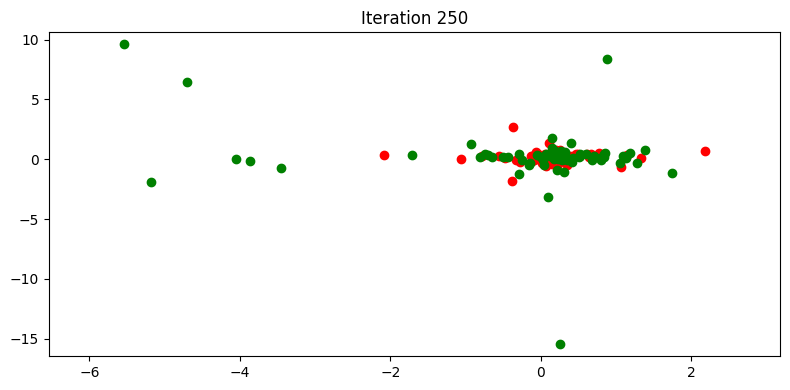

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.datasets import make_blobs
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

# Set data
X = circles  # You may need to define the 'circles' variable

# Set constants
total_iterations = 300
interval = 5
start = 250
np.random.seed(40)
n_ex = 15

init = np.random.multivariate_normal(mean = [0,0],cov = np.eye(2)*10**-4,size = 150)
# init[green,:] = np.random.multivariate_normal(mean = [-1,0],cov = np.eye(2)*10**-4,size = sum(green))
# init[red,:] = np.random.multivariate_normal(mean = [1,0],cov = np.eye(2)*10**-4,size = sum(red))

tsne_start = TSNE(n_components=2, init=init, early_exaggeration=n_ex, n_iter=start)
embedding_initial = tsne_start.fit_transform(X)

# Set up the plot
fig, ax = plt.subplots(figsize = (8,4))
scatter1 = ax.scatter(embedding_initial[red, 0], embedding_initial[red, 1], c='red')
scatter2 = ax.scatter(embedding_initial[green, 0], embedding_initial[green, 1], c='green')
title = ax.set_title('t-SNE Embedding')

# Animation update function
def update(frame):
    global start  # Add this line to use the global variable 'start'
    print(f"{start + frame * interval}/{total_iterations} - {round(100*(start + frame * interval)/total_iterations,2)}%")
    # Update t-SNE iterations
    tsne = TSNE(n_components=2, init=init, early_exaggeration=n_ex, n_iter=start + frame * interval)

    # Transform data using t-SNE
    embedding = tsne.fit_transform(X)

    # Update scatter plot data
    scatter1.set_offsets(embedding[red])
    scatter2.set_offsets(embedding[green])

    # Update title
    title.set_text(f'Iteration {start + frame * interval}')

    # Set axis limits dynamically based on the data
    ax.set_xlim(np.min(embedding[:, 0]) - 1, np.max(embedding[:, 0]) + 1)
    ax.set_ylim(np.min(embedding[:, 1]) - 1, np.max(embedding[:, 1]) + 1)



# Make the plot tight
plt.tight_layout()

# Create animation
ani = FuncAnimation(fig, update, frames=np.arange(0,(total_iterations - start) // interval), interval=130, blit=False)

# # Save the animation as a GIF file
# animation_file = 'tsne_bad_conv_animation.gif'
# ani.save(animation_file, writer='imagemagick')

# Display the animation
HTML(ani.to_jshtml())

Animation Example

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.animation as animation

# Create a figure and axis
fig, ax = plt.subplots()
x = np.linspace(0, 2 * np.pi, 100)
line, = ax.plot(x, np.sin(x))

# Function to update the plot for each frame of the animation
def update(frame):
    line.set_ydata(np.sin(x + frame / 10))  # Update the y-data of the plot
    return line,

# Create the animation
ani = FuncAnimation(fig, update, frames=100, interval=50, blit=True)

# Display the animation
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


#Generating Examples

In [ ]:
for i in range (start,start+n_results):
  print(f"Generating results: {i-start+1}/{n_results} {round((i-start+1)*100/(n_results),2)}%")
  init = np.random.multivariate_normal([0,0], np.eye(2) * 10**-4, 150)
  tsne = manifold.TSNE(
        n_components=n_components,
        init=init,
        perplexity=perplexity_res,
        n_iter=2000,
        early_exaggeration = 250,
        n_jobs = -1
    )
  tsne_ex = manifold.TSNE(
        n_components=n_components,
        init=init,
        perplexity=perplexity_res,
        n_iter=250,
        early_exaggeration = 250,
        n_jobs = -1
    )

  Y = tsne.fit_transform(circles)
  Y_ex = tsne_ex.fit_transform(circles)
  kl_val = tsne.kl_divergence_
  label = classify_kl(kl_val)

  #print(label)
  #print(f"KL divergence value: {round(kl_val,4)}")

  # Saving Results

  # X_res[i-start,:] = Y.reshape((1,-1))
  # X_ex[i-start,:] = Y_ex.reshape((1,-1))
  # y[i-start] = label
  # dic = {"init": init, "exg": Y_ex, "res":Y, "label": label}
  # #Save dictionary
  # with open(f"/content/drive/MyDrive/tsne_circles/Circles_pkl_files/run_{i}.pkl", 'wb') as pkl_file:
  #    pickle.dump(dic, pkl_file)


  # Visualization

  # plt.figure(figsize=(12, 5))

  # plt.subplot(1,2,1)
  # plt.scatter(Y[red, 0], Y[red, 1], c="r")
  # plt.scatter(Y[green, 0], Y[green, 1], c="g")
  # plt.title(f"run_{i}")

  # plt.subplot(1,2,2)
  # plt.scatter(Y_ex[red, 0], Y_ex[red, 1], c="r")
  # plt.scatter(Y_ex[green, 0], Y_ex[green, 1], c="g")
  # plt.title(f"Early Exaggeration run_{i}")
  # plt.tight_layout()

  # plt.show()


Generating results: 1/5000 0.02%
Generating results: 2/5000 0.04%
Generating results: 3/5000 0.06%
Generating results: 4/5000 0.08%
Generating results: 5/5000 0.1%
Generating results: 6/5000 0.12%
Generating results: 7/5000 0.14%
Generating results: 8/5000 0.16%
Generating results: 9/5000 0.18%
Generating results: 10/5000 0.2%
Generating results: 11/5000 0.22%
Generating results: 12/5000 0.24%
Generating results: 13/5000 0.26%
Generating results: 14/5000 0.28%
Generating results: 15/5000 0.3%
Generating results: 16/5000 0.32%
Generating results: 17/5000 0.34%
Generating results: 18/5000 0.36%
Generating results: 19/5000 0.38%
Generating results: 20/5000 0.4%
Generating results: 21/5000 0.42%
Generating results: 22/5000 0.44%
Generating results: 23/5000 0.46%
Generating results: 24/5000 0.48%
Generating results: 25/5000 0.5%
Generating results: 26/5000 0.52%
Generating results: 27/5000 0.54%
Generating results: 28/5000 0.56%
Generating results: 29/5000 0.58%
Generating results: 30/5000 

Whoops need to load init...

In [ ]:
import os
local_download_path = "/content/drive/MyDrive/tsne_circles/Circles_pkl_files"
n_files = len(os.listdir(local_download_path))
X_init = np.zeros((n_files,n_samples*2))
counter = 0
for filename in os.listdir(local_download_path):
  if filename.endswith(".pkl"):
    with open(f"{local_download_path}/{filename}", 'rb') as pickle_file:
      print(f"Extracting file {counter+1}/{n_files} {round((counter+1)*100/n_files,2)}%")
      loaded_dict = pickle.load(pickle_file)
      new_sample = loaded_dict["init"].reshape(1,-1)
      X_init[counter,:] = new_sample
      counter +=1

In [ ]:
import pandas as pd
df_X_init = pd.DataFrame(X_init)
df_X_ex = pd.DataFrame(X_ex)
df_y = pd.DataFrame(y)
csv_path_X_init = "/content/drive/MyDrive/tsne_circles/Circles_csvs/X_init1"
csv_path_X_ex = "/content/drive/MyDrive/tsne_circles/Circles_csvs/X_ex1"
csv_path_y = "/content/drive/MyDrive/tsne_circles/Circles_csvs/y1"
df_X_init.to_csv(csv_path_X_init, header=False,index = False)
df_X_ex.to_csv(csv_path_X_ex, header=False,index = False)
df_y.to_csv(csv_path_y, header=False,index = False)